###### Author: VietNDuc

In [ ]:
%matplotlib widget

import os
import gc
import warnings
import random
import numpy as np
import pandas as pd
# Widgets
import ipywidgets as widgets
# Dataviz
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import plotly
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns
# Notebook
from IPython.display import Javascript
from IPython.core.display import display
from IPython.core.display import HTML
# Interactive + geomap
import holoviews as hv
import folium as f
from holoviews.operation.datashader import datashade, dynspread
from datashader import transfer_functions as tf
from colorcet import fire
from bokeh.io import push_notebook, show, output_notebook

Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
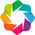

In [2]:
output_notebook()
hv.extension('bokeh', 'matplotlib')
warnings.filterwarnings('ignore')
gc.enable()
random.seed(123)

In [3]:
DIR = 'dataset/'
novel_DIR = 'dataset/novel_covid19_kaggle/'
kaggle_DIR = 'dataset/covid19-dataset-kaggle/'
owid_DIR = 'dataset/owid/'

In [4]:
# region
wr = pd.read_csv(os.path.join(DIR, 'wr.csv'))
# OurWorld in data
owid_covid19 = pd.read_csv(os.path.join(owid_DIR, 'owid-covid-data.csv'))

## 1. Country wise (Death, Confirm, Recovery)

In [41]:
country_wise = pd.read_csv(os.path.join(kaggle_DIR, 'country_wise_latest.csv'))

In [55]:
def country_wise_func(name):
    """
    """
    assert name in ['Confirmed', 'Deaths', 'Recovered'], "Must be Confirmed or Deaths or Recovered"
    tmp = country_wise.sort_values(by=name, ascending=True).tail(10)
    fig = px.bar(tmp, x=name, y="Country/Region",
                 color="WHO Region",
                 color_discrete_map={'Europe': 'rgb(99, 110, 250)',
                                     'Eastern Mediterranean': 'rgb(0, 204, 150)',
                                     'Africa': 'rgb(250, 247, 99)',
                                     'Americas': 'rgb(239, 85, 259)',
                                     'Western Pacific': 'rgb(137, 250, 99)',
                                     'South-East Asia': 'rgb(171, 99, 250)'},
                 text=name)
    fig.update(layout_coloraxis_showscale=False)
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
    fig.update_layout(title={'text': "Country wise 07/07/2020",
                             'font': {'size': 30},
                             'y':0.98,'x':0.5,
                             'xanchor': 'center',
                             'yanchor': 'top'},
                      width=1200, height=700,
                      uniformtext_minsize=8,
                      uniformtext_mode='hide',
                      yaxis={'categoryorder':'total ascending'},
                      yaxis_showgrid=False)
    
    return fig

In [53]:
def case_eventhandler(change):
    """
    """
    out_.clear_output()
    with out_:
        fig = country_wise_func(case_menu.value)
        fig['layout']['title']['text'] = fig['layout']['title']['text'] + " ({})".format(case_menu.value.lower())
        fig.show()

In [54]:
out_ = widgets.Output(layout=widgets.Layout(left='20px'))
case_menu = widgets.Dropdown(options=[('Deaths', "Deaths"),
                                      ('Confirmed', 'Confirmed'),
                                      ('Recovery', 'Recovered')],
                               value="Deaths",
                               description='Case :')

case_menu.observe(case_eventhandler, names='value')
control_config = widgets.VBox([widgets.Label(value="CONFIG PANEL",
                                             layout=widgets.Layout(left='80px')),
                               case_menu])

display(widgets.VBox([control_config, out_]))

# 2. Timeseries

## 2.1 Death cases by country

In [5]:
time_series_deaths = pd.read_csv(os.path.join(novel_DIR, 'time_series_covid_19_deaths.csv'))

In [6]:
deaths = time_series_deaths.groupby('Country/Region').sum().reset_index().set_index('Country/Region').iloc[:, 2:]
deaths.index.name = 'name'

In [7]:
tt = deaths.merge(wr.loc[:, ['name', 'sub-region']], on='name', how='left').set_index('name')

In [9]:
group_lk = tt['sub-region'].to_dict()

In [48]:
colours = {'Southern Asia': '#da45de',
           'Southern Europe': '#d1292d',
           'Northern Africa': '#f7c97a',
           'Sub-Saharan Africa': '#fc0d08',
           'Latin America and the Caribbean': '#cbf555',
           'Western Asia': '#0e7374',
           'Australia and New Zealand': '#838212',
           'Western Europe': '#f8e4b7',
           'Eastern Europe': '#ae58dd',
           'South-eastern Asia': '#caa80a',
            np.nan: '#72c3c3',
           'Northern America': '#0090fe',
           'Eastern Asia': '#6f9a9e',
           'Northern Europe': '#9d2bc0',
           'Melanesia': '#afd169',
           'Central Asia': '#3ea03e'}

In [19]:
%%capture
fig, ax = plt.subplots(figsize=(20, 11))
def draw_barchart(curr_date):
    tmp = tt[curr_date].sort_values(ascending=True).tail(10)
    ax.clear()
    ax.barh(y=tmp.index, width=tmp.values, color=[colours[group_lk[x]] for x in tmp.index])
    for i, (value, name) in enumerate(zip(tmp.values, tmp.index)):
        ax.text(value, i, name, size=14, weight=600, ha='right', va='bottom')
        ax.text(value, i-.25, group_lk[name], size=10, color='#444444', ha='right', va='baseline')
        ax.text(value, i, f'{value:,.0f}', size=14, ha='left',  va='center')
    ax.text(1, 0.4, curr_date, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Confirmed cases by country', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.1, 'Coronavirus confirmed cases by country from 01/2020 to 07/2020',
            transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'by @vietnd', transform=ax.transAxes, ha='right',
            color='#777777', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)

In [ ]:
animator = animation.FuncAnimation(fig, draw_barchart, frames=list(tt.columns[:-1]))
HTML(animator.to_jshtml())

## 2.2 Confirmed Case

In [62]:
covid19 = pd.read_csv(os.path.join(kaggle_DIR, 'covid_19_clean_complete.csv'))

In [63]:
cases = ['Confirmed', 'Deaths', 'Recovered', 'Active']
covid19['Total'] = covid19['Confirmed'] + covid19['Deaths'] + covid19['Recovered']
covid19[cases] = covid19[cases].fillna(0)
covid19[['Province/State']] = covid19[['Province/State']].fillna('')
covid19['Date'] = pd.to_datetime(covid19['Date']).dt.strftime('%m/%d/%Y')

In [64]:
groupby_covid19 = covid19.groupby(['Date', 'WHO Region', 'Country/Region'])[cases].max().reset_index()
groupby_covid19['size'] = groupby_covid19['Confirmed'].pow(0.3)

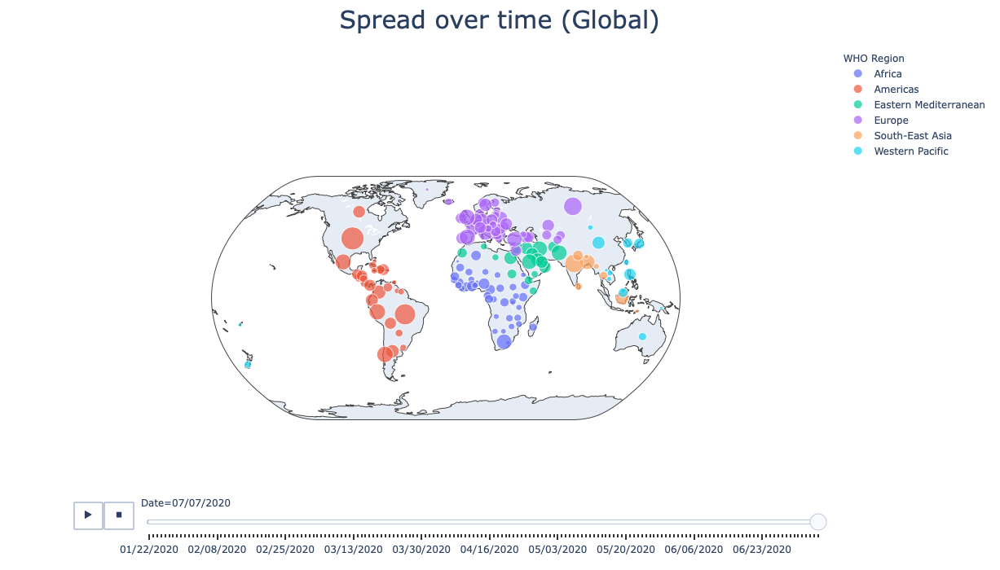

In [108]:
fig = px.scatter_geo(groupby_covid19, locations='Country/Region',
                     locationmode='country names',
                     color="WHO Region", size='size',
                     hover_name="Country/Region",
                     #range_color=[0, max(groupby_covid19['Confirmed'])+2],
                     animation_frame="Date",
                     projection="natural earth",
                    )
fig.update(layout_coloraxis_showscale=False)
fig.update_layout(title={'text': "Spread over time (Global)",
                         'font': {'size': 30},
                         'y':0.98,'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  width=1200, height=700)
fig.show()

In [109]:
groupby_covid19.drop('size', axis=1, inplace=True)

## 2.3 Recovered and Deaths Ratio

In [15]:
day_wise = pd.read_csv(os.path.join(kaggle_DIR, 'day_wise.csv'))

In [16]:
day_wise['Date'] = pd.to_datetime(day_wise['Date']).dt.strftime('%m/%d/%Y')

In [38]:
death_recovered = day_wise[['Date', 'Deaths', 'Recovered']]
death_recovered['%D'] = death_recovered['Deaths'] * 100 /  (death_recovered['Deaths'] + death_recovered['Recovered'])
death_recovered['%R'] = 100 - death_recovered['%D']

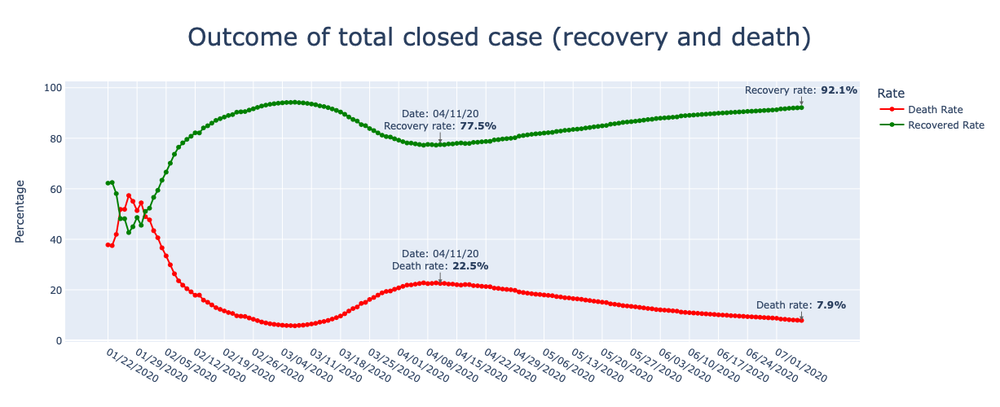

In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=death_recovered['Date'], y=death_recovered['%D'],
                         mode="lines+markers",
                         line=go.scatter.Line(color="red"),
                         name="Death Rate",
                        )
             )
fig.add_trace(go.Scatter(x=death_recovered['Date'], y=death_recovered['%R'],
                         mode="lines+markers",
                         line=go.scatter.Line(color="green"),
                         name="Recovered Rate",
                        )
             )
anns = [dict(x="07/07/2020", y=7.86, xref="x", yref="y",
             text="Death rate: <b>7.9%", showarrow=True,
             arrowhead=2, arrowsize=1, arrowcolor="#636363",
             ax=0, ay=-20),
        dict(x="07/07/2020", y=93, xref="x", yref="y",
             text="Recovery rate: <b>92.1%", showarrow=True,
             arrowhead=2, arrowsize=1, arrowcolor="#636363",
             ax=0, ay=-20),
        dict(x="04/11/2020", y=78, xref="x", yref="y",
             text="Date: 04/11/20<br>" + "Recovery rate: <b>77.5%",
             showarrow=True,
             arrowhead=2, arrowsize=1, arrowcolor="#636363",
             ax=0, ay=-30),
        dict(x="04/11/2020", y=22.5, xref="x", yref="y",
             text="Date: 04/11/20<br>" + "Death rate: <b>22.5%",
             showarrow=True,
             arrowhead=2, arrowsize=1, arrowcolor="#636363",
             ax=0, ay=-30)]
fig.update_layout(title={'text': "Outcome of total closed case (recovery and death)",
                         'font': {'size': 30},
                         'y':0.93,'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  legend_title={'text': "Rate",
                                'font': {'size': 15}},
                  yaxis_title='Percentage',
                  hovermode='x unified',
                  hoverlabel=dict(bgcolor="white", 
                                  font_size=12, 
                                  font_family="Rockwell"),
                  annotations=anns,
                  width=1300, height=500
                )
fig.update_yaxes(nticks=6)
fig.update_xaxes(nticks=30)
fig.show()

In [33]:
del death_recovered
gc.collect

<function gc.collect(generation=2)>

## 2.4 Daily Cases

In [ ]:
trace1 = go.Bar(x=day_wise['Date'],
                y=day_wise['New cases'],
                width=0.5,
                hovertemplate='Date: %{x} <br>'+
                              'Cases: <b>%{y}</b><extra></extra>',
                name="Daily")

layout1 = go.Layout(title={'text': "COVID19 Daily new cases",
                         'font': {'size': 30},
                         'y':0.94,'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  xaxis_tickfont_size=12,
                  yaxis=dict(title='Daily number of new cases',
                             titlefont_size=16,
                             tickfont_size=12,
                             range=[-5000, 250000]),
                  bargap=0.15,
                  width=1200, height=500,
                  xaxis_showgrid=False,
                  showlegend=True
                   )
trace2 = go.Scatter(x=day_wise['Date'],
                    y=day_wise['New cases'].rolling(window=3).mean(),
                    hovertemplate='Date: %{x} <br>'+
                                   'Cases: <b>%{y}</b><extra></extra>',
                    name="3-days moving average",
                   )
fig = go.FigureWidget(data=[trace1],
                      layout=layout1)
fig.update_xaxes(nticks=30)

In [12]:
def response(change):
    if mov3_avg_checkbox.value:
        fig.add_traces(trace2)
    else:
        fig.data = [fig.data[0]]

In [13]:
mov3_avg_checkbox = widgets.Checkbox(description='3-days Moving Average', value=False)
mov3_avg_checkbox.observe(response, names="value")

display(widgets.VBox([mov3_avg_checkbox, fig]))

    'data': [{'hover…

## 2.5 New confirmed cases and new recovered case

In [35]:
confirm_recovery = day_wise.loc[day_wise['Date'] >= '03/01/2020'][['Date', 'New cases', 'New recovered']]

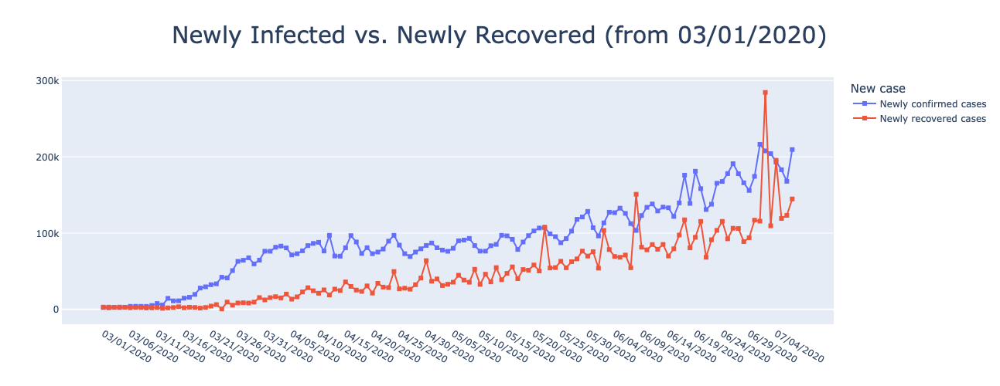

In [36]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=confirm_recovery['Date'], y=confirm_recovery['New cases'],
                         mode="lines+markers",
                         marker_symbol='square',
                         name="Newly confirmed cases",
                         hovertemplate = 'Confirmed: <b>%{y}</b><extra></extra>',
                        )
             )
fig.add_trace(go.Scatter(x=confirm_recovery['Date'], y=confirm_recovery['New recovered'],
                         mode="lines+markers",
                         marker_symbol='square',
                         name="Newly recovered cases",
                         hovertemplate = 'Recovered: <b>%{y}</b><extra></extra>',
                        )
             )
fig.update_layout(title={'text': "Newly Infected vs. Newly Recovered (from 03/01/2020)",
                         'font': {'size': 30},
                         'y':0.93,'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  legend_title={'text': "New case",
                                'font': {'size': 15}},
                  hovermode='x unified',
                  hoverlabel=dict(bgcolor="white", 
                                  font_size=12, 
                                  font_family="Rockwell"),
                  width=1200, height=500,
                  xaxis_showgrid=False
                )
fig.update_yaxes(nticks=6)
fig.update_xaxes(nticks=30)
fig.show()

## 2.6 Case Fatality Rate

In [65]:
groupby_covid19['CFR'] = groupby_covid19['Deaths'] * 100 / groupby_covid19['Confirmed']
groupby_covid19['CFR'] = groupby_covid19['CFR'].fillna(0)

In [75]:
group = ['United Kingdom', 'Vietnam', 'Sweden', 'Denmark', 'US', 'China', 'Brazil', 'France', 'Italia', 'Mexico']

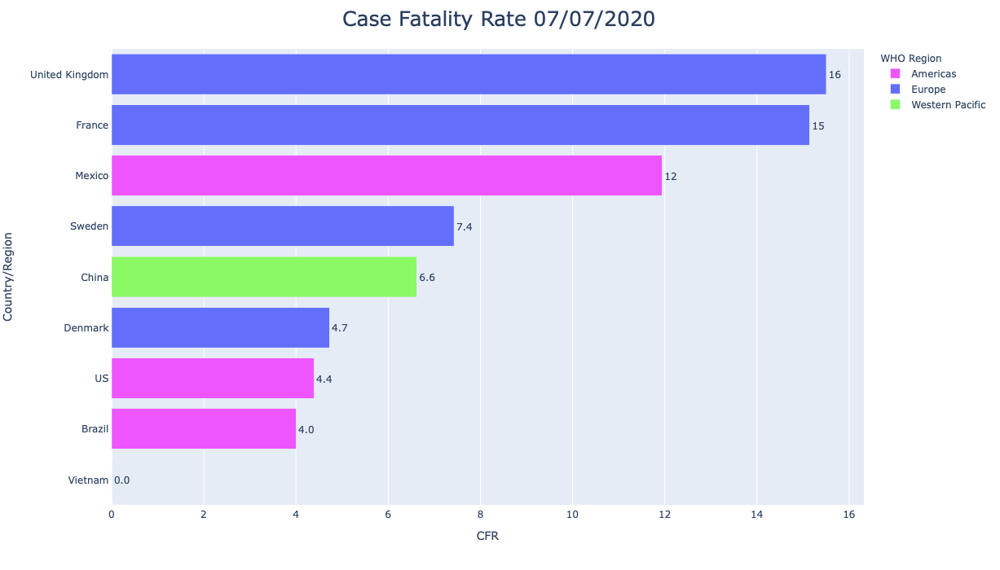

In [77]:
tmp = groupby_covid19.loc[(groupby_covid19['Country/Region'].isin(group)) & (groupby_covid19['Date'] == '07/07/2020')]
fig = px.bar(tmp, x='CFR', y="Country/Region",
             color="WHO Region",
             color_discrete_map={'Europe': 'rgb(99, 110, 250)',
                                 'Eastern Mediterranean': 'rgb(0, 204, 150)',
                                 'Africa': 'rgb(250, 247, 99)',
                                 'Americas': 'rgb(239, 85, 259)',
                                 'Western Pacific': 'rgb(137, 250, 99)',
                                 'South-East Asia': 'rgb(171, 99, 250)'},
             text='CFR')
fig.update(layout_coloraxis_showscale=False)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(title={'text': "Case Fatality Rate 07/07/2020",
                         'font': {'size': 25},
                         'y':0.98,'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  width=1200, height=700,
                  uniformtext_minsize=8,
                  uniformtext_mode='hide',
                  yaxis={'categoryorder':'total ascending'},
                  yaxis_showgrid=False)

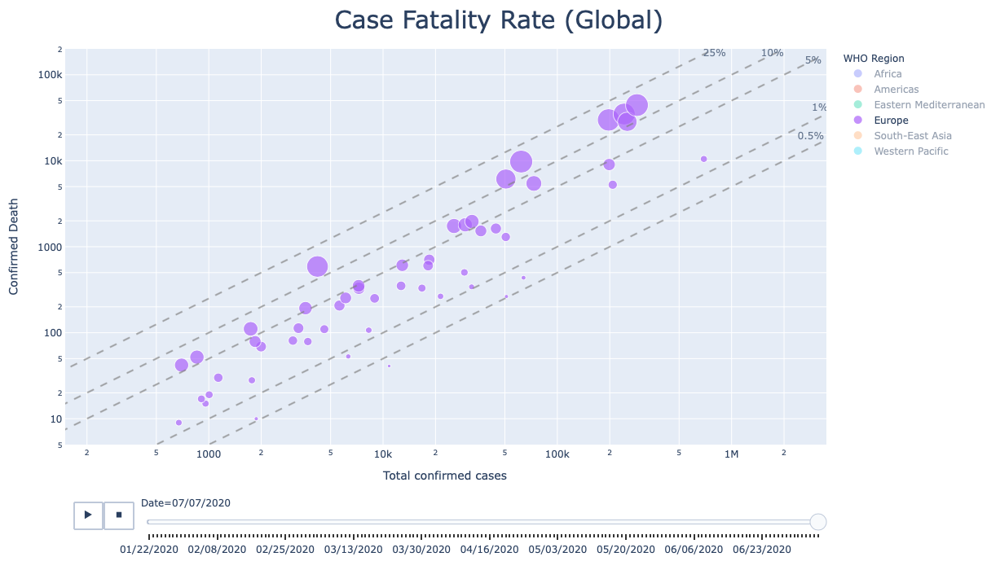

In [111]:
fig = px.scatter(groupby_covid19, x="Confirmed", y="Deaths",
                 # text='Country/Region',
                 color="WHO Region",
                 animation_frame="Date",
                 hover_name="Country/Region",
                 range_color=[0, max(groupby_covid19['CFR'])+2],
                 size="CFR", log_x=True, log_y=True,
                 size_max=50,
                 range_x=[150, 3500000], range_y=[5, 200000])

# fig.update_traces(textposition='top center')
fig.add_trace(go.Scatter(x=[600, 3400000], y=[3, 17000],
                         mode="lines+text", opacity=0.7,
                         text="0.5%",
                         textposition="top left",
                         line=go.scatter.Line(color="gray", dash="dash"),
                         showlegend=False
                        )
             )
fig.add_trace(go.Scatter(x=[300, 3600000], y=[3, 36000],
                         mode="lines+text", opacity=0.7,
                         text="1%",
                         textposition="top left",
                         line=go.scatter.Line(color="gray", dash="dash"),
                         showlegend=False
                        )
             )
fig.add_trace(go.Scatter(x=[100, 3300000], y=[5, 165000],
                         mode="lines+text", opacity=0.7,
                         text="5%",
                         textposition="bottom left",
                         line=go.scatter.Line(color="gray", dash="dash"),
                         showlegend=False
                        )
             )
fig.add_trace(go.Scatter(x=[50, 2000000], y=[5, 200000],
                         mode="lines+text", opacity=0.7,
                         text="10%",
                         textposition="bottom left",
                         line=go.scatter.Line(color="gray", dash="dash"),
                         showlegend=False
                        )
             )
fig.add_trace(go.Scatter(x=[20, 800000], y=[5, 200000],
                         mode="lines+text", opacity=0.7,
                         text="25%",
                         textposition="bottom center",
                         line=go.scatter.Line(color="gray", dash="dash"),
                         showlegend=False
                        )
             )
fig.update_layout(title={'text': "Case Fatality Rate (Global)",
                         'font': {'size': 30},
                         'y':0.98,'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  xaxis_title="Total confirmed cases",
                  yaxis_title="Confirmed Death",
                 #  font=dict(color="#7f7f7f"),
                  width=1200, height=700,
                  xaxis_fixedrange=True,
                  yaxis_fixedrange=True)

fig.show()

# 3. Testing

In [95]:
test_world = pd.read_csv(os.path.join(kaggle_DIR, 'worldometer_data.csv'))

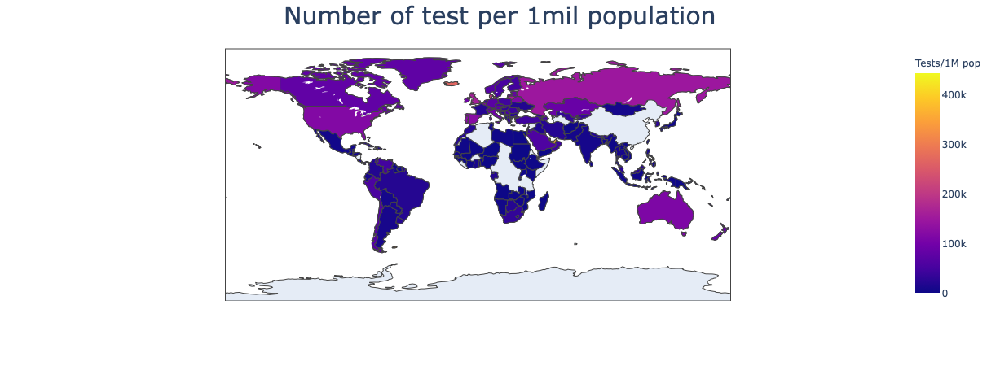

In [97]:
fig = px.choropleth(test_world, 
                    locations="Country/Region",
                    locationmode='country names',
                    color="Tests/1M pop",
                    hover_name="Country/Region")
fig.update_layout(title={'text': "Number of test per 1mil population",
                         'font': {'size': 30},
                         'y':0.98,'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'})

fig.show()

# 4. Policy response

In [78]:
policy = pd.read_csv(os.path.join(DIR, 'policy.csv'))

In [79]:
policy['Date'] = policy['Date'].map(lambda x: str(x)[:4] + '-' + str(x)[4:6] + '-' + str(x)[6:])
policy['Date'] = pd.to_datetime(policy['Date']).dt.strftime('%m/%d/%Y')

In [80]:
school_map = {0.: "No data",
              1.: "No measures",
              2.: "Recommend closing",
              3.: "Require closing (some levels)",
              4.: "Require closing all levels"}
policy['C1_School closing'] = policy['C1_School closing'] + 1
policy['C1_School closing'] = policy['C1_School closing'].fillna(0)
policy['C1_School closing'] = policy['C1_School closing'].map(lambda x: school_map[x])

In [81]:
workplace_map = {0.: "No data",
                 1.: "No measures",
                 2.: "Recommend closing(or WFH)",
                 3.: "Require closing for some sectors",
                 4.: "Require closing all but essential workplaces"}
policy['C2_Workplace closing'] = policy['C2_Workplace closing'] + 1
policy['C2_Workplace closing'] = policy['C2_Workplace closing'].fillna(0)
policy['C2_Workplace closing'] = policy['C2_Workplace closing'].map(lambda x: workplace_map[x])

In [82]:
cancel_event_map = {0.: "No data",
                    1.: "No measures",
                    2.: "Recommend cancelling",
                    3.: "Require cancelling"}
policy['C3_Cancel public events'] = policy['C3_Cancel public events'] + 1
policy['C3_Cancel public events'] = policy['C3_Cancel public events'].fillna(0)
policy['C3_Cancel public events'] = policy['C3_Cancel public events'].map(lambda x: cancel_event_map[x])

In [83]:
close_transport_map = {0.: "No data",
                       1.: "No COVID19 public information campaign",
                       2.: "Recommended closing (or reduce volume)",
                       3.: "Required closing (or prohibit most using it)"}
policy['C5_Close public transport'] = policy['C5_Close public transport'] + 1
policy['C5_Close public transport'] = policy['C5_Close public transport'].fillna(0)
policy['C5_Close public transport'] = policy['C5_Close public transport'].map(lambda x: close_transport_map[x])

In [84]:
inter_travels_map = {0.: "No data",
                     1.: "No measures",
                     2.: "Screening",
                     3.: "Quarantine arrivals from high-risk regions",
                     4.: "Ban on high-risk regions",
                     5.: "Total border closure"}
policy['C8_International travel controls'] = policy['C8_International travel controls'] + 1
policy['C8_International travel controls'] = policy['C8_International travel controls'].fillna(0)
policy['C8_International travel controls'] = policy['C8_International travel controls'].map(lambda x: inter_travels_map[x])

In [88]:
def policy_chart(policy_name):
    """
    """
    text = {'C1_School closing': "School closures",
            'C2_Workplace closing': "Workplace closures",
            'C3_Cancel public events': "Cancellation of public events",
            'C5_Close public transport': "Public transport",
            'C8_International travel controls': "International travel controls"}
    fig = px.choropleth(policy.loc[policy['Date'] >= '01/26/2020'], 
                        locations="CountryName",
                        locationmode='country names',
                        color=policy_name,
                        hover_name="CountryName", 
                        animation_frame='Date',
                        labels={policy_name: "Level"},
                        # color_continuous_scale=px.colors.sequential.Plasma,
#                         category_orders={'C1_School closing': ["No data",
#                                                                "No measures",
#                                                                "Recommend closing",
#                                                                "Require closing (some levels)",
#                                                                "Require closing all levels"
#                                                               ]
#                                         },
#                         color_discrete_map={"#e0e0e0", "#2a939b", "#fceb8c", "#de8e16", "#d26e66"},
                        projection='equirectangular',
                       )
    fig.update(layout_coloraxis_showscale=False)
    fig.update_layout(title={'text': text[policy_name],# + " from 26/01/2020",
                             'font': {'size': 30},
                             'y':0.98,'x':0.43,
                             'xanchor': 'center',
                             'yanchor': 'top'},
                      width=1200, height=700)
    fig.show()

In [89]:
def policy_eventhandler(change):
    '''Event handler for learning rate slider
    '''
    out_.clear_output()
    with out_:
        policy_chart(policy_menu.value)

In [90]:
out_ = widgets.Output(layout=widgets.Layout(left='20px'))
policy_menu = widgets.Dropdown(options=[('School Closures', "C1_School closing"),
                                        ('Workplaces Closures', 'C2_Workplace closing'),
                                        ('Cancellation of public events', 'C3_Cancel public events'),
                                        ('Public transport', 'C5_Close public transport'),
                                        ('International travel controls', 'C8_International travel controls')],
                               value="C1_School closing",
                               description='Policy :',)

policy_menu.observe(policy_eventhandler, names='value')
control_config = widgets.VBox([widgets.Label(value="CONFIG PANEL", layout=widgets.Layout(left='80px')),
                               policy_menu])

display(widgets.VBox([control_config, out_]))

## 5. UseCase : China

In [91]:
time_series_confirmed = pd.read_csv(os.path.join(novel_DIR, 'time_series_covid_19_confirmed.csv'))

In [93]:
confirm = time_series_confirmed.groupby('Country/Region').sum().reset_index().set_index('Country/Region').iloc[:, 2:]

china_confirm = confirm.loc[confirm.index == 'China']
china_confirm = china_confirm.T.reset_index()
china_confirm.columns = ['Date', 'Confirmed']
china_confirm['Date'] =  pd.to_datetime(china_confirm['Date']).dt.strftime('%m/%d/%Y')

tmp = china_confirm.loc[china_confirm['Date'] <= '03/03/2020']

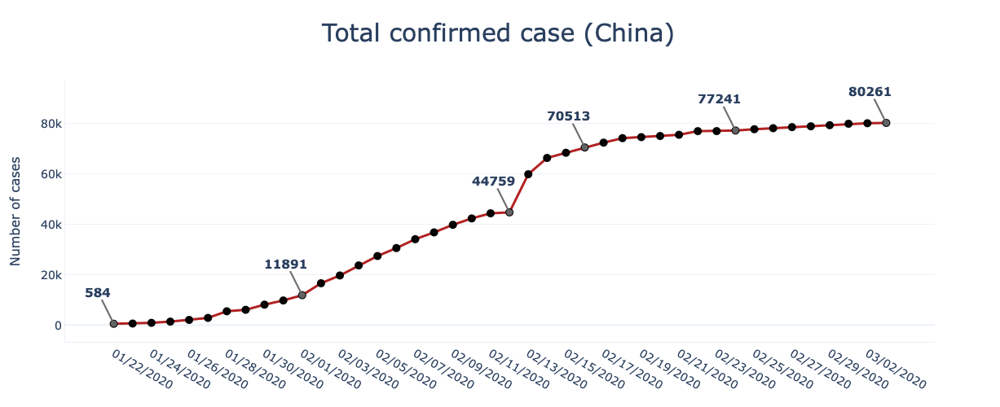

In [94]:
trace = go.Scatter(x=tmp['Date'],
                   y=tmp['Confirmed'],
                   mode='lines+markers',
                   marker_symbol='circle-dot',
                   line=dict(color='firebrick', width=3),
                   marker=dict(color='black',size=10),
                  )
layout1 = go.Layout(title={'text': "Total confirmed case (China)",
                           'font': {'size': 30},
                           'y':0.94,'x':0.5,
                           'xanchor': 'center',
                           'yanchor': 'top'},
                    xaxis_tickfont_size=14,
                    yaxis=dict(title='Number of cases',
                               titlefont_size=16,
                               tickfont_size=14),
                    width=1200, height=500,
                    xaxis_showgrid=False,
                    template='plotly_white')
fig = go.Figure(data=[trace],
               layout=layout1)
fig.add_annotation(x="01/22/2020", y=584, text="<b>584</b>")
fig.add_annotation(x="02/01/2020", y=11891, text="<b>11891")
fig.add_annotation(x="02/12/2020", y=44759, text="<b>44759")
fig.add_annotation(x="02/16/2020", y=70513, text="<b>70513")
fig.add_annotation(x="02/24/2020", y=77241, text="<b>77241")
fig.add_annotation(x="03/03/2020", y=80261, text="<b>80261")
fig.update_annotations(dict(xref="x",yref="y",
                            showarrow=True,
                            arrowhead=6,
                            arrowsize=1,
                            arrowwidth=2,
                            arrowcolor="#636363",
                            ax=-20,
                            ay=-40,
                            font=dict(size=15)))
fig.update_xaxes(nticks=40)
fig.show()